In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import matplotlib.style as style

import warnings
warnings.filterwarnings(action='ignore')

# for scaling and imputation of null values
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer

# for building/evaluating models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import sklearn.metrics as metrics

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
ckd = ("/content/gdrive/MyDrive/Team 52 Project Folders/Datasets/kidney_disease.csv")

ckd = pd.read_csv(ckd)
ckd.head()

,id,age,bp,sg,al,su,rbc,pc,pcc,ba,...,pcv,wc,rc,htn,dm,cad,appet,pe,ane,classification
0,0,48.0,80.0,1.020,1.0,0.0,NaN,normal,notpresent,notpresent,...,44,7800,5.2,yes,yes,no,good,no,no,ckd
1,1,7.0,50.0,1.020,4.0,0.0,NaN,normal,notpresent,notpresent,...,38,6000,NaN,no,no,no,good,no,no,ckd
2,2,62.0,80.0,1.010,2.0,3.0,normal,normal,notpresent,notpresent,...,31,7500,NaN,no,yes,no,poor,no,yes,ckd
3,3,48.0,70.0,1.005,4.0,0.0,normal,abnormal,present,notpresent,...,32,6700,3.9,yes,no,no,poor,yes,yes,ckd
4,4,51.0,80.0,1.010,2.0,0.0,normal,normal,notpresent,notpresent,...,35,7300,4.6,no,no,no,good,no,no,ckd


In [4]:
# display the columns
ckd.columns

Index(['id', 'age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr',
       'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad',
       'appet', 'pe', 'ane', 'classification'],
      dtype='object')

In [5]:
ckd.info()
# we can see that columns pcv, wc, and rc are objects but should be numbers, fix later

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              400 non-null    int64  
 1   age             391 non-null    float64
 2   bp              388 non-null    float64
 3   sg              353 non-null    float64
 4   al              354 non-null    float64
 5   su              351 non-null    float64
 6   rbc             248 non-null    object 
 7   pc              335 non-null    object 
 8   pcc             396 non-null    object 
 9   ba              396 non-null    object 
 10  bgr             356 non-null    float64
 11  bu              381 non-null    float64
 12  sc              383 non-null    float64
 13  sod             313 non-null    float64
 14  pot             312 non-null    float64
 15  hemo            348 non-null    float64
 16  pcv             330 non-null    object 
 17  wc              295 non-null    obj

In [6]:
# look at unique values in columns, but not ID
for i in ckd.drop("id",axis=1).columns:
    print('Distinct values in "{}" before cleaning:\n'.format(i),ckd[i].unique())

Distinct values in "age" before cleaning:
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
Distinct values in "bp" before cleaning:
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
Distinct values in "sg" before cleaning:
 [1.02  1.01  1.005 1.015   nan 1.025]
Distinct values in "al" before cleaning:
 [ 1.  4.  2.  3.  0. nan  5.]
Distinct values in "su" before cleaning:
 [ 0.  3.  4.  1. nan  2.  5.]
Distinct values in "rbc" before cleaning:
 [nan 'normal' 'abnormal']
Distinct values in "pc" before cleaning:
 ['normal' 'abnormal' nan]
Distinct values in "pcc" before cleaning:
 ['notpresent' 'present' nan]
Distinct values in "ba" before cleaning:
 ['notpresent' 'present' nan]
Distinct values in "bgr" before cleaning

In [7]:
# get rid of weird values from above
# probably a better way to do this but it works
for i in range(ckd.shape[0]):
    if ckd.iloc[i,16]=='\t?':
        ckd.iloc[i,16]=np.nan
    if ckd.iloc[i,16]=='\t43':
        ckd.iloc[i,16]='43'
    if ckd.iloc[i,17]=='\t?':
        ckd.iloc[i,17]=np.nan
    if ckd.iloc[i,17]=='\t6200':
        ckd.iloc[i,17]= '6200'
    if ckd.iloc[i,17]=='\t8400':
        ckd.iloc[i,17]= '8400'
    if ckd.iloc[i,18]=='\t?':
        ckd.iloc[i,18]=np.nan
    if ckd.iloc[i,20] in [' yes','\tyes']:
        ckd.iloc[i,20]='yes'
    if ckd.iloc[i,20]=='\tno':
        ckd.iloc[i,20]='no'
    if ckd.iloc[i,21]=='\tno':
        ckd.iloc[i,21]='no'
    if ckd.iloc[i,25]=='ckd\t':
        ckd.iloc[i,25]='ckd'
    if ckd.iloc[i,25]=='ckd':
        ckd.iloc[i,25]='yes'
    if ckd.iloc[i,25]=='notckd':
        ckd.iloc[i,25]='no'

In [8]:
# show unique values after dropping weird ones
for i in ckd.drop("id",axis=1).columns:
    print('Distinct values in "{}" after cleaning:\n'.format(i),ckd[i].unique())

Distinct values in "age" after cleaning:
 [48.  7. 62. 51. 60. 68. 24. 52. 53. 50. 63. 40. 47. 61. 21. 42. 75. 69.
 nan 73. 70. 65. 76. 72. 82. 46. 45. 35. 54. 11. 59. 67. 15. 55. 44. 26.
 64. 56.  5. 74. 38. 58. 71. 34. 17. 12. 43. 41. 57.  8. 39. 66. 81. 14.
 27. 83. 30.  4.  3.  6. 32. 80. 49. 90. 78. 19.  2. 33. 36. 37. 23. 25.
 20. 29. 28. 22. 79.]
Distinct values in "bp" after cleaning:
 [ 80.  50.  70.  90.  nan 100.  60. 110. 140. 180. 120.]
Distinct values in "sg" after cleaning:
 [1.02  1.01  1.005 1.015   nan 1.025]
Distinct values in "al" after cleaning:
 [ 1.  4.  2.  3.  0. nan  5.]
Distinct values in "su" after cleaning:
 [ 0.  3.  4.  1. nan  2.  5.]
Distinct values in "rbc" after cleaning:
 [nan 'normal' 'abnormal']
Distinct values in "pc" after cleaning:
 ['normal' 'abnormal' nan]
Distinct values in "pcc" after cleaning:
 ['notpresent' 'present' nan]
Distinct values in "ba" after cleaning:
 ['notpresent' 'present' nan]
Distinct values in "bgr" after cleaning:
 [121.  

In [9]:
# drop id column, it won't get us anything from an EDA/ML perspective
ckd.drop('id',axis=1,inplace=True)

In [10]:
# update datatypes of columns that have wrong data type
cols = ['pcv','wc','rc']

# empty list for numeric columns
num = []

# add numeric columns to list
for i in ckd.columns:
    if ckd[i].dtype=='float64':
        num.append(i)

# append object fields that should be numeric to list of numeric columns
num = num+cols

# update datatype of these columns to float
for i in cols:
    ckd[i]=ckd[i].astype('float')
    
ckd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             391 non-null    float64
 1   bp              388 non-null    float64
 2   sg              353 non-null    float64
 3   al              354 non-null    float64
 4   su              351 non-null    float64
 5   rbc             248 non-null    object 
 6   pc              335 non-null    object 
 7   pcc             396 non-null    object 
 8   ba              396 non-null    object 
 9   bgr             356 non-null    float64
 10  bu              381 non-null    float64
 11  sc              383 non-null    float64
 12  sod             313 non-null    float64
 13  pot             312 non-null    float64
 14  hemo            348 non-null    float64
 15  pcv             329 non-null    float64
 16  wc              294 non-null    float64
 17  rc              269 non-null    flo

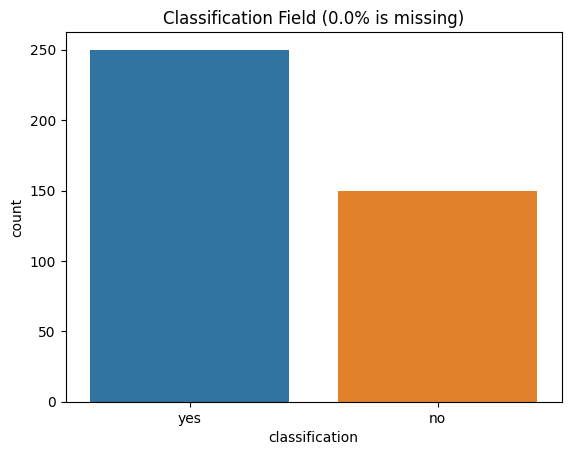

In [11]:
# check if classification column is missing any data points
missing=(100*(1-(ckd['classification'].dropna().shape[0])/ckd.shape[0]))
    
fig=sns.countplot(x=ckd['classification'])
plt.title("Classification Field ({}% is missing)".format(missing))
plt.show()

In [12]:
# looking at distribution of numeric columns
cat_cols = []

for col in ckd.columns:
    if not col in num:
        cat_cols.append(col)

# remove target variable
cat_cols.remove('classification')

cat_cols

['rbc', 'pc', 'pcc', 'ba', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane']

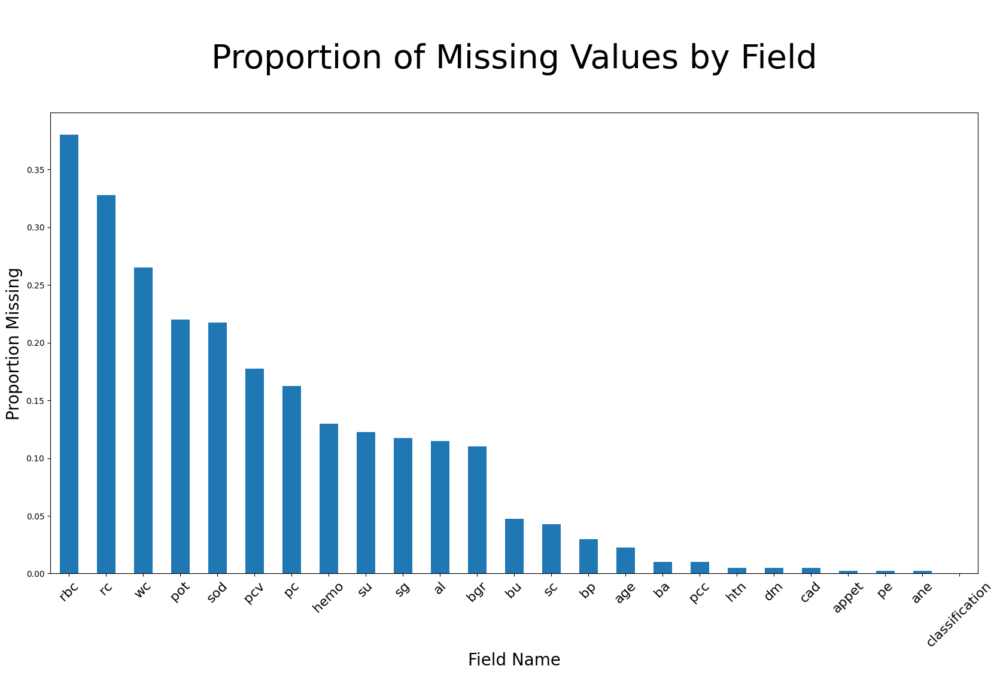

In [13]:
# proportion of missing values, by field
missing=((ckd.isnull().sum()/ckd.shape[0])).sort_values(ascending=False)
missing.plot(kind='bar', figsize=(20,10))
plt.title("\nProportion of Missing Values by Field\n",fontsize=40)
plt.xlabel('Field Name', fontsize=20)
plt.xticks(rotation = 45, fontsize=16)
plt.ylabel('Proportion Missing', fontsize=20)
plt.show()

In [14]:
# one hot encoding for all categorical variables
# all have only two categories so this is ideal
encoded=pd.get_dummies(ckd,drop_first=True,prefix_sep=': ')
encoded.head()
# this made all the null values 0, so have to fix that
names={}
# get value from indices of original dataset where value is nan and apply to one hot encoded data
for col in ckd.columns:
    for colname in encoded.columns:
        if col+': ' in colname and col in cat_cols:
            names[col]=colname
            for i in range(len(ckd)):
                if type(ckd.loc[i,col])!=str:
                    if math.isnan(ckd.loc[i,col]):
                        encoded.loc[i,colname]=ckd.loc[i,col]

In [15]:
# making sure the last loop worked and put nan's back
test=pd.DataFrame(columns=ckd.columns)
for col in test.columns:
    if col in cat_cols:
        test[col]=encoded[names[col]]
    elif col=='classification':
        test[col]=encoded['classification: yes']
    else:
        test[col]=encoded[col]

# should all be 0, checks if cell is null in original but not in encoded
((pd.isna(ckd)==pd.isna(test))==False).sum()

age               0
bp                0
sg                0
al                0
su                0
rbc               0
pc                0
pcc               0
ba                0
bgr               0
bu                0
sc                0
sod               0
pot               0
hemo              0
pcv               0
wc                0
rc                0
htn               0
dm                0
cad               0
appet             0
pe                0
ane               0
classification    0
dtype: int64

In [16]:
# evaluate different transformers/scalers for imputation of missing values
normal=QuantileTransformer(output_distribution='normal')
uniform=QuantileTransformer(output_distribution='uniform')
non_standard=PowerTransformer(standardize=False)
standard_power=PowerTransformer()
robust=RobustScaler()
wide_robust=RobustScaler(quantile_range=(15,85))
standard=StandardScaler()
min_max=MinMaxScaler()

trans=[normal,uniform,non_standard,standard_power,robust,wide_robust,standard]

pipelines=[] 
for i in trans:
    p=make_pipeline(i)
    pipelines.append(p)
pipelines[2]=make_pipeline(non_standard,min_max)

In [17]:
# loop over different pipelines, fit the transformers we chose to the data
arrays=[]
for pipeline in pipelines:
    arr=pipeline.fit_transform(encoded)
    arrays.append(arr)

# loop over fitted data in each pipeline, append output to list, including original one hot encoded data
dataframes=[encoded]
for arr in arrays:
    data=pd.DataFrame(arr,columns=encoded.columns)
    dataframes.append(data)

In [18]:
# specify the start/end of categorical and numeric features in encoded data
categorical=encoded.columns[14:]
numeric=encoded.columns[:14]

In [19]:
n_rows, n_cols = (14,8)
num_colors = ['red','blue','green','orange','purple','yellow','pink','indigo']

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numeric Features After Transformation', fontsize=80)
for i in range(14):
    fig=sns.distplot(encoded.iloc[:,i], color="g", label='Original', norm_hist=True, ax=axes[i,0], kde_kws={"lw":4})
    fig=fig.legend(loc='best', fontsize=35)
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=pipelines[j-1].steps[0][0]
        fig=sns.distplot(dataframes[j].iloc[:,i], color = num_colors[j-1], label=label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
        fig=fig.legend(loc='best', fontsize=30)
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=35)

plt.tight_layout()
plt.subplots_adjust(top=.93)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

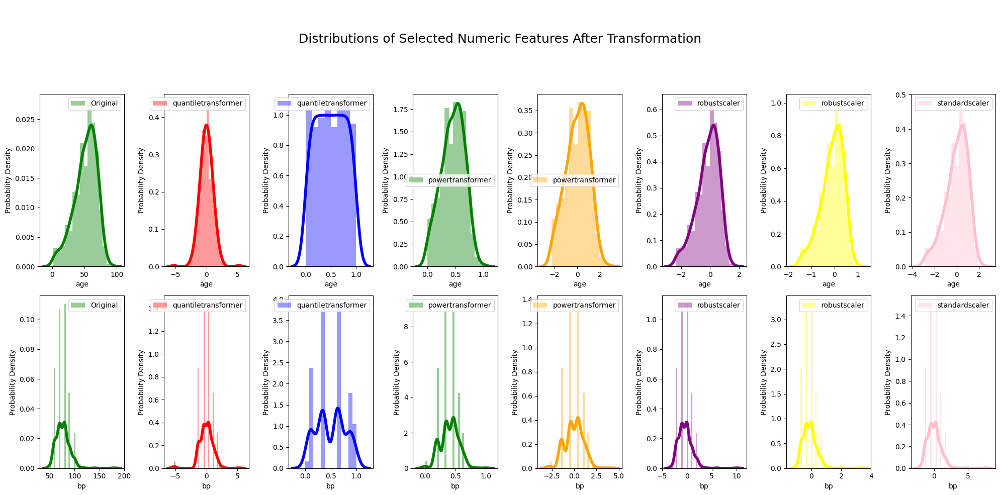

In [20]:
# added for image in initial findings document, smaller output
n_rows, n_cols = (2,8)
num_colors = ['red','blue','green','orange','purple','yellow','pink','indigo']

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20,10))
figure.suptitle('\n\nDistributions of Selected Numeric Features After Transformation\n\n\n', fontsize=18)
for i in range(2):
    fig=sns.distplot(encoded.iloc[:,i], color="g", label='Original', norm_hist=True, ax=axes[i,0], kde_kws={"lw":4})
    fig=fig.legend(loc='best')
    axes[i,0].set_xlabel(axes[i,0].get_xlabel())
    axes[i,0].set_ylabel("Probability Density")

for j in range(1,8):
    for i in range(2):
        label=pipelines[j-1].steps[0][0]
        fig=sns.distplot(dataframes[j].iloc[:,i], color = num_colors[j-1], label=label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
        fig=fig.legend(loc='best')
        axes[i,j].set_ylabel("Probability Density")
        axes[i,j].set_xlabel(axes[i,j].get_xlabel())

plt.tight_layout()
plt.show()

In [21]:
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nCategorical Features After Transformation', fontsize=80)
for i in range(10):
    g=sns.countplot(encoded.iloc[:,i+14], color="indigo", label="Original", ax=axes[i,0])
    g=g.legend(loc='best', fontsize=35)
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    axes[i,0].set_ylabel("Count",fontsize=25)

for j in range(1,8):
    for i in range(10):
        label=pipelines[j-1].steps[0][0]
        g=sns.countplot(dataframes[j].iloc[:,i+14], color=num_colors[j-1], label=label, ax=axes[i,j])
        g=g.legend(loc='best', fontsize=30)
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=35)
        axes[i,j].set_ylabel("Count",fontsize=25)

plt.tight_layout()
plt.subplots_adjust(top=.93)
plt.show()

In [22]:
# let's look at imputing values based on knn imputation, for each transformer we are testing out
imp=KNNImputer(weights='distance', n_neighbors=8)

# need to convert one hot data df to list of arrays, to pass to the imputer, for each transformer we are investigating
intarr=[encoded.to_numpy()]
for i in range(1,len(dataframes)):
    intarr.append(imp.fit_transform(dataframes[i]))

# now inverse transform the interim array for each pipeline (transformer)
arrays=[intarr[0]]
for i in range(1,len(intarr)):
    arrays.append(pipelines[i-1].inverse_transform(intarr[i]))
    
#finally, we can append the values into the list of arrays
imputed=[]
for i in range(len(arrays)):
    imputed.append(pd.DataFrame(arrays[i],columns=encoded.columns))

In [23]:
n_rows, n_cols = (14,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('\n\nDistributions of Numeric Features After Imputation', fontsize=80)
for i in range(14):
    fig=sns.distplot(encoded.iloc[:,i], color="indigo", label='Original', norm_hist=True, ax=axes[i,0], kde_kws={"lw":4})
    fig=fig.legend(loc='best', fontsize=35)
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    axes[i,0].set_ylabel("Probability Density",fontsize=25)

for j in range(1,8):
    for i in range(14):
        label=pipelines[j-1].steps[0][0]
        fig=sns.distplot(imputed[j].iloc[:,i], color=num_colors[j-1], label=label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
        fig=fig.legend(loc='best', fontsize=35)
        axes[i,j].set_ylabel("Probability Density",fontsize=25)
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=35)

plt.tight_layout()
plt.subplots_adjust(top=.93)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

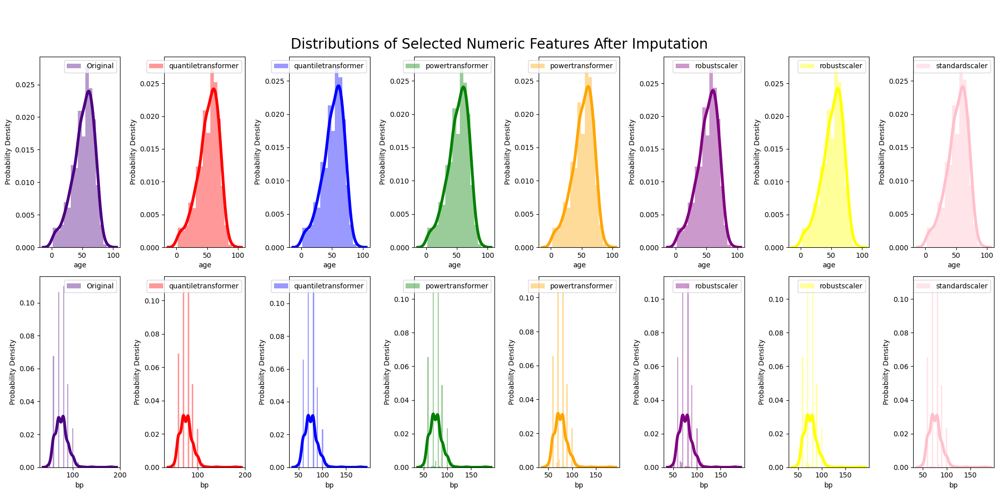

In [24]:
# added for image in initial findings doc
n_rows, n_cols = (2,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20,10))
figure.suptitle('\n\nDistributions of Selected Numeric Features After Imputation', fontsize=20)
for i in range(2):
    fig=sns.distplot(encoded.iloc[:,i], color="indigo", label='Original', norm_hist=True, ax=axes[i,0], kde_kws={"lw":4})
    fig=fig.legend(loc='best')
    axes[i,0].set_xlabel(axes[i,0].get_xlabel())
    axes[i,0].set_ylabel("Probability Density")

for j in range(1,8):
    for i in range(2):
        label=pipelines[j-1].steps[0][0]
        fig=sns.distplot(imputed[j].iloc[:,i], color=num_colors[j-1], label=label, norm_hist=True, ax=axes[i,j], kde_kws={"lw":4})
        fig=fig.legend(loc='best')
        axes[i,j].set_ylabel("Probability Density")
        axes[i,j].set_xlabel(axes[i,j].get_xlabel())

plt.tight_layout()
plt.show()

In [25]:
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle("\n\nCategorical Features After Imputation", fontsize=80)
for i in range(10):
    g=sns.countplot(encoded.iloc[:,i+14], color="indigo", label=categorical[i], ax=axes[i,0])
    g=g.legend(loc='best', fontsize=35)
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    axes[i,0].set_ylabel("Count",fontsize=25)

for j in range(1,8):
    for i in range(10):
        label=pipelines[j-1].steps[0][0]
        g=sns.countplot(imputed[j].iloc[:,i+14], color=num_colors[j-1], label=label, ax=axes[i,j])
        g=g.legend(loc='best', fontsize=30)
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=35)
        axes[i,j].set_ylabel("Count",fontsize=25)

plt.tight_layout()
plt.subplots_adjust(top=.93)
plt.show()

# looks like no changes for categoricals

In [26]:
# in above graph, some nan's get replaced with really small numbers for some reason
testdf=imputed.copy()
for j in range(1,8):
    testdata=testdf[j]
    for i in range(14,25):
        col=testdata.iloc[:,i]
        for k in range(400):
            if col[k]>=0.5:
                col[k]=1
            else:
                col[k]=0

In [27]:
n_rows, n_cols = (10,8)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(70, 100))
figure.suptitle('Categorical Features After Imputation', fontsize=80)
for i in range(10):
    g=sns.countplot(encoded.iloc[:,i+14], color="indigo", label=categorical[i], ax=axes[i,0])
    g=g.legend(loc='best', fontsize=35)
    axes[i,0].set_xlabel(axes[i,0].get_xlabel(),fontsize=33)
    axes[i,0].set_ylabel("Count",fontsize=25)

for j in range(1,8):
    for i in range(10):
        label=categorical[i]+'\n'+pipelines[j-1].steps[0][0]
        g=sns.countplot(testdf[j].iloc[:,i+14], color=num_colors[j-1], label=label, ax=axes[i,j])
        g=g.legend(loc='best', fontsize=35)
        axes[i,j].set_xlabel(axes[i,j].get_xlabel(),fontsize=35)
        axes[i,j].set_ylabel("Count",fontsize=25)
plt.tight_layout()
plt.subplots_adjust(top=.96)
plt.show()

In [28]:
#create dataframe with readable values for use later, contains the imputed values
no_nulls = imputed[1].copy()
#no_nulls
# go back to original values for a dataframe without nulls for us to use
# probably a better way to do this but it works
for i in range(no_nulls.shape[0]):
    if no_nulls.iloc[i,14]== 1:
        no_nulls.iloc[i,14]='normal'
    if no_nulls.iloc[i,14]== 0:
        no_nulls.iloc[i,14]='abnormal'
    if no_nulls.iloc[i,15]== 1:
        no_nulls.iloc[i,15]='normal'
    if no_nulls.iloc[i,15]== 0:
        no_nulls.iloc[i,15]='abnormal'
    if no_nulls.iloc[i,16]== 1:
        no_nulls.iloc[i,16]='present'
    if no_nulls.iloc[i,16]== 0:
        no_nulls.iloc[i,16]='notpresent'
    if no_nulls.iloc[i,17]== 1:
        no_nulls.iloc[i,17]='present'
    if no_nulls.iloc[i,17]== 0:
        no_nulls.iloc[i,17]='notpresent'
    if no_nulls.iloc[i,18]== 1:
        no_nulls.iloc[i,18]='yes'
    if no_nulls.iloc[i,18]== 0:
        no_nulls.iloc[i,18]='no'
    if no_nulls.iloc[i,19]== 1:
        no_nulls.iloc[i,19]='yes'
    if no_nulls.iloc[i,19]== 0:
        no_nulls.iloc[i,19]='no'
    if no_nulls.iloc[i,20]== 1:
        no_nulls.iloc[i,20]='yes'
    if no_nulls.iloc[i,20]== 0:
        no_nulls.iloc[i,20]='no'
    if no_nulls.iloc[i,21]== 1:
        no_nulls.iloc[i,21]='poor'
    if no_nulls.iloc[i,21]== 0:
        no_nulls.iloc[i,21]='good'
    if no_nulls.iloc[i,22]== 1:
        no_nulls.iloc[i,22]='yes'
    if no_nulls.iloc[i,22]== 0:
        no_nulls.iloc[i,22]='no'
    if no_nulls.iloc[i,23]== 1:
        no_nulls.iloc[i,23]='yes'
    if no_nulls.iloc[i,23]== 0:
        no_nulls.iloc[i,23]='no'
    if no_nulls.iloc[i,24]== 1:
        no_nulls.iloc[i,24]='ckd'
    if no_nulls.iloc[i,24]== 0:
        no_nulls.iloc[i,24]='notckd'

In [29]:
# it looks like the gaussian quantile transformer did the best, so use that for imputation (second column)
encoded=imputed[1].copy()
encoded.dropna().shape

(400, 25)

In [30]:
encoded.head()

,age,bp,sg,al,su,bgr,bu,sc,sod,pot,...,pc: normal,pcc: present,ba: present,htn: yes,dm: yes,cad: yes,appet: poor,pe: yes,ane: yes,classification: yes
0,48.0,80.0,1.020,1.0,0.0,121.000000,36.0,1.2,136.0,4.7,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
1,7.0,50.0,1.020,4.0,0.0,90.317304,18.0,0.8,140.0,4.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,62.0,80.0,1.010,2.0,3.0,423.000000,53.0,1.8,135.0,4.8,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,48.0,70.0,1.005,4.0,0.0,117.000000,56.0,3.8,111.0,2.5,...,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0
4,51.0,80.0,1.010,2.0,0.0,106.000000,26.0,1.4,140.0,4.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


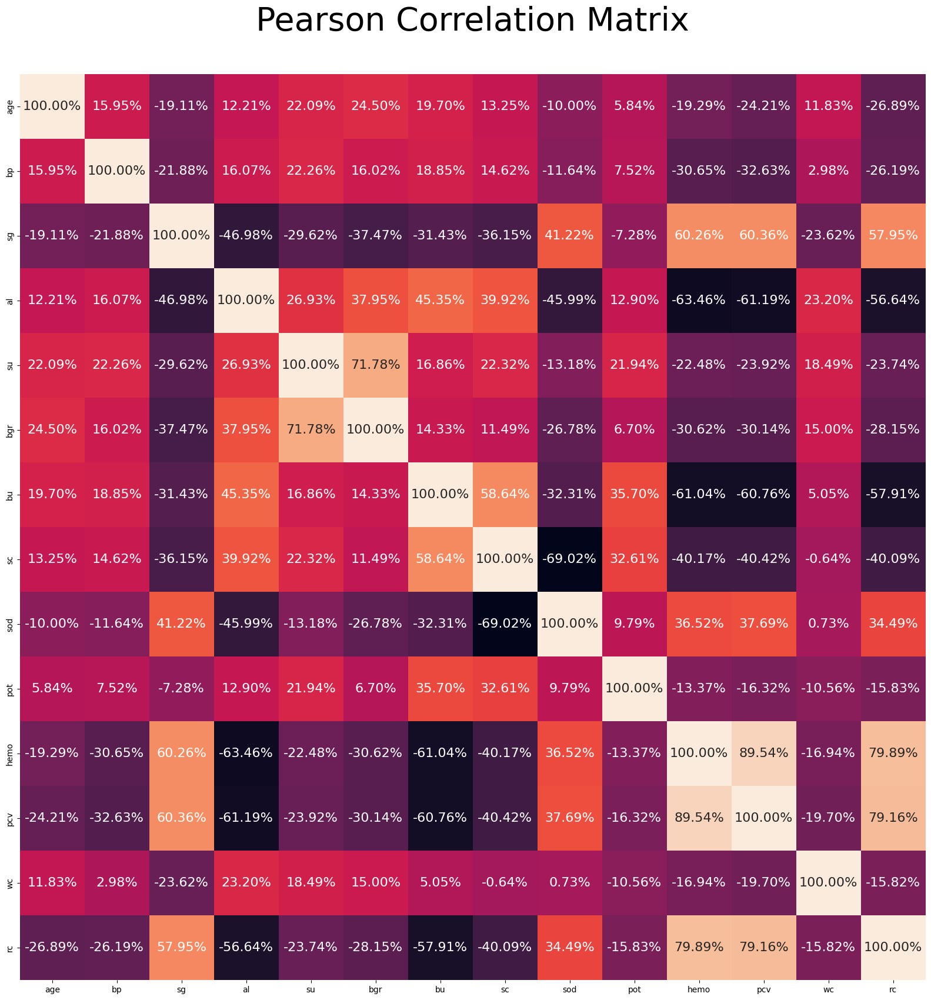

In [31]:
#correlation matrix

numeric=ckd.drop(cat_cols, axis=1, inplace=False)

plt.figure(figsize=(20,20))

sns.heatmap(numeric.corr("pearson"),square=True,annot=True,annot_kws={'fontsize':16},fmt='.2%',cbar=False)
plt.title("Pearson Correlation Matrix\n",fontsize=40)
plt.show()

In [63]:
# k means clustering first
X=encoded.drop("classification: yes",axis=1,inplace=False)
Y=encoded["classification: yes"]

scaled=standard.fit_transform(encoded)
scaled_data=standard.fit_transform(X)

In [33]:
Y.tail()

395    0.0
396    0.0
397    0.0
398    0.0
399    0.0
Name: classification: yes, dtype: float64

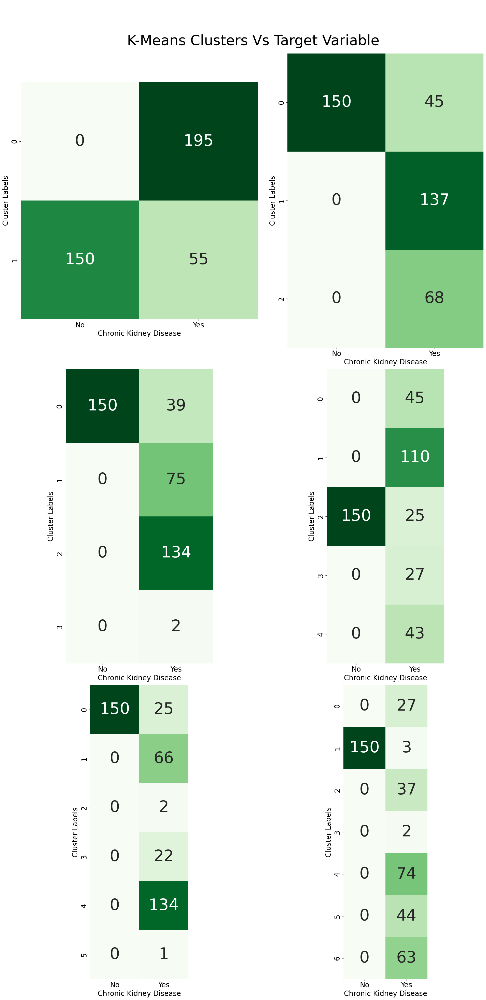

In [34]:
n_rows, n_cols = (3,2)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 40))
figure.suptitle('\n\nK-Means Clusters Vs Target Variable', fontsize=40)

for index in range(6):
    i,j = (index // n_cols), (index % n_cols)
    model=KMeans(n_clusters=index+2)
    model.fit(scaled_data)
    cluster_labels=model.predict(scaled_data)
    sns.heatmap(pd.crosstab(cluster_labels,Y),
                ax=axes[i,j],
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':45},
                fmt='d')
    axes[i,j].set_xlabel("Chronic Kidney Disease",fontsize=20)
    axes[i,j].set_ylabel("Cluster Labels",fontsize=20) 
    axes[i,j].set_yticklabels(axes[i,j].get_yticklabels(),fontsize=20)
    axes[i,j].set_xticklabels(["No","Yes"],fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=.93)
plt.show()

# not great results, mixed clusters and probably some overfitting

In [35]:
# alright let's do some PCA with k means

pca = PCA()
pca.fit(scaled_data)
pca_features=list(range(1,25))
ax=plt.figure(figsize=(15,7.5))
sns.barplot(pca_features, pca.explained_variance_)
plt.ylabel('Explained Variance',fontsize=20)
plt.xlabel('# of PCA Components',fontsize=20)
plt.title("PCA Components by Explained Variance",fontsize='30')
plt.show()
# seems like 1 component is the elbow point

TypeError: ignored

<Figure size 1500x750 with 0 Axes>

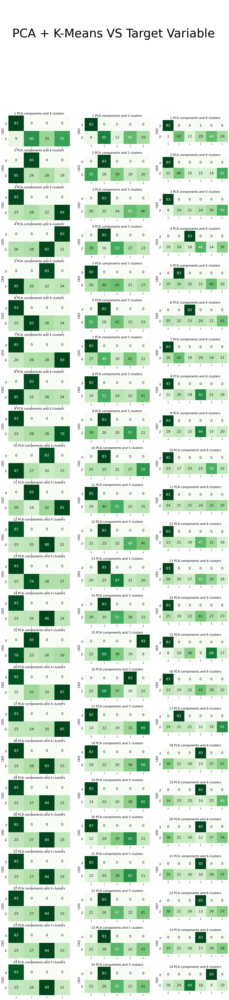

In [36]:
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.4, random_state=12)
n_rows, n_cols = (24,3)

figure, axes = plt.subplots(nrows=n_rows, ncols=n_cols,figsize=(20, 80))

figure.suptitle('\n\nPCA + K-Means VS Target Variable\n', fontsize=60)

for index in range(72):
    i,j = (index // n_cols), (index % n_cols)
    pca = PCA(n_components=i+1)
    pca_data=pca.fit_transform(X_train)
    model=KMeans(n_clusters=j+4, random_state=5)
    model.fit(pca_data)
    cluster_labels=model.predict(pca_data)
    sns.heatmap(pd.crosstab(Y_train,cluster_labels),
                ax=axes[i,j],
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':18},
                fmt='d')
    axes[i,j].set_title("{} PCA components and {} clusters".format(i+1,j+4),fontsize=15)
    axes[i,j].set_ylabel("CKD",fontsize=15)
    axes[i,j].set_xlabel(None)
    axes[i,j].set_xticklabels(axes[i,j].get_xticklabels(),fontsize=10)
    axes[i,j].set_yticklabels(["No","Yes"],fontsize=10)

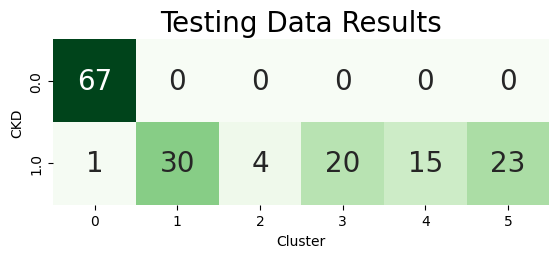

In [37]:
# once again with testing data
pca = PCA(n_components=1)
    
pca_training_data=pca.fit_transform(X_train)

model=KMeans(n_clusters=6, random_state=5)
    
model.fit(pca_training_data)

pca_testing_data=pca.transform(X_test)

cluster_labels=model.predict(pca_testing_data)

sns.heatmap(pd.crosstab(Y_test,cluster_labels),
                cmap='Greens',
                square='True',
                cbar=False,
                annot=True,
                annot_kws={'fontsize':20},
                fmt='d')

plt.title("Testing Data Results",fontsize=20)
plt.ylabel("CKD",fontsize=10)
plt.xlabel("Cluster",fontsize=10)
plt.show()

In [38]:
# ok now let's try a bunch of other models

knn_3=KNeighborsClassifier(n_neighbors=3,weights='distance')

knn_8=KNeighborsClassifier(n_neighbors=8,weights='distance')

knn_15=KNeighborsClassifier(n_neighbors=15,weights='distance')

svm_rbf=SVC(probability=True)
    
svm_2=SVC(kernel='poly',degree=2,probability=True)
    
svm_3=SVC(kernel='poly',degree=3,probability=True)

nb=GaussianNB()

log_reg=LogisticRegression()

dtc=DecisionTreeClassifier()

rf=RandomForestClassifier()

models=[knn_3,knn_8,knn_15,svm_rbf,svm_2,svm_3,nb,log_reg,dtc,rf]

names=["Weighted 3 Nearest Neighbors","Weighted 8 Nearest Neighbors", "Weighted 15 Nearest Neighbors","SVM Radial Basis Function","SVM 2nd Degree Polynomial","SVM 3rd Degree Polynomial","Naive Bayes","Logistic Regression","Decision Tree","Random Forest"]

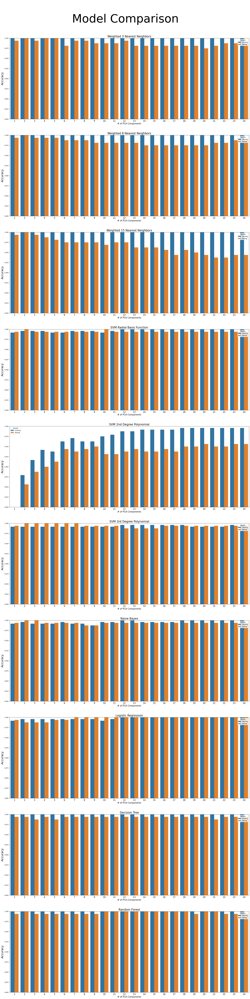

In [39]:
n_rows, n_cols= 10,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 120))

figure.suptitle('\nModel Comparison', fontsize=80, y=.91)
# set up empty arrays for training/testing labels to use later
tr_result = np.empty(shape=(24,1),dtype="object")
ts_result = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_result[i]="Training"
    ts_result[i]="Testing"

result = np.vstack((tr_result,ts_result))
result=result.reshape((48,))

# set range for number of pca components, duplicate for train/test
comps=[i for i in range(1,25)] * 2

all_pca_tr_acc=[]
all_pca_ts_acc=[]

all_pca_ts_fpr = []
all_pca_ts_tpr = []
all_pca_ts_threshold = []
all_pca_ts_auc = []
all_pca_comps = []
all_model_data = pd.DataFrame()

for index in range(10):
    pca_tr_acc=[]
    pca_ts_acc=[]
    
    pca_ts_fpr = []
    pca_ts_tpr = []
    pca_ts_threshold = []
    pca_ts_auc = []
    
    for n_comps in range(1,25):
        
        model=models[index]
        
        pca=PCA(n_components=n_comps)
        
        pca_model=make_pipeline(pca,model)
        
        pca_model.fit(X_train,Y_train)
        
        y_tr_pred= pca_model.predict(X_train)
        
        y_tr_probs = pca_model.predict_proba(X_train)
        tr_acc_score = accuracy_score(Y_train,y_tr_pred)
        tr_p1 = y_tr_probs[:,1]
        tr_fpr, tr_tpr, tr_threshold = metrics.roc_curve(Y_train, tr_p1)
        tr_auc = metrics.auc(tr_fpr,tr_tpr)
        
        pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        all_pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=pca_model.predict(X_test)
        
        y_ts_probs = pca_model.predict_proba(X_test)
        ts_acc_score = accuracy_score(Y_test,y_ts_pred)
        ts_p1 = y_ts_probs[:,1]
        ts_fpr, ts_tpr, ts_threshold = metrics.roc_curve(Y_test, ts_p1)
        ts_auc = metrics.auc(ts_fpr,ts_tpr)
        
        pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
        all_pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
        
        pca_ts_fpr.append(ts_fpr)
        pca_ts_tpr.append(ts_tpr)
        pca_ts_threshold.append(ts_threshold)
        pca_ts_auc.append(ts_auc)
        all_pca_ts_fpr.append(ts_fpr)
        all_pca_ts_tpr.append(ts_tpr)
        all_pca_ts_threshold.append(ts_threshold)
        all_pca_ts_auc.append(ts_auc)
        all_pca_comps.append(n_comps)
        
    
    model_data = pd.DataFrame()
    
    model_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    model_data["Results"] = result
    
    #added
    model_data["Model"] = names[index]
    
    all_model_data = all_model_data.append(model_data, ignore_index=True)
    
    sns.barplot(x=comps, y="PCA", hue="Results", data=model_data, ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(names[index],fontsize=20)
    
    axes[index].set_xlabel("# of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=20)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
        
plt.show()


In [40]:
def print_ROC_Curve( TITLE, LIST ) :
    fig = plt.figure(figsize=(6,4))
    plt.title( TITLE )
    #for theResults in LIST :
    NAME = LIST[0]
    fpr = LIST[2]
    tpr = LIST[3]
    auc = LIST[4]
    theLabel = "AUC " + NAME + ' %0.2f' % auc
    plt.plot(fpr, tpr, label = theLabel )
    plt.legend(loc = 'lower right', fontsize=10)
    #plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [41]:
new_list = [list(e) for e in zip(all_pca_ts_acc, all_pca_ts_fpr, all_pca_ts_tpr, all_pca_ts_auc, all_pca_comps)]

In [42]:
all_model_data_new = all_model_data.loc[all_model_data['Results'] == "Testing"]

In [43]:
model_list = list(all_model_data_new['Model'])
roc_curve_list = [x+[y] for x, y in zip(new_list,model_list)]

In [ ]:
for i in roc_curve_list:
    print_ROC_Curve('ROC Curve for '+i[5]+', Test Split',[i[5]+' w/ '+ str(i[4])+' PCA Components',i[0],i[1],i[2],i[3]])

Output hidden; open in https://colab.research.google.com to view.

In [44]:
log_reg_2=LogisticRegression()

dtc_2=DecisionTreeClassifier()

rf_2=RandomForestClassifier()

best_models=[log_reg_2,dtc_2,rf_2]

best_names=["Logistic Regression","Decision Tree","Random Forest"]

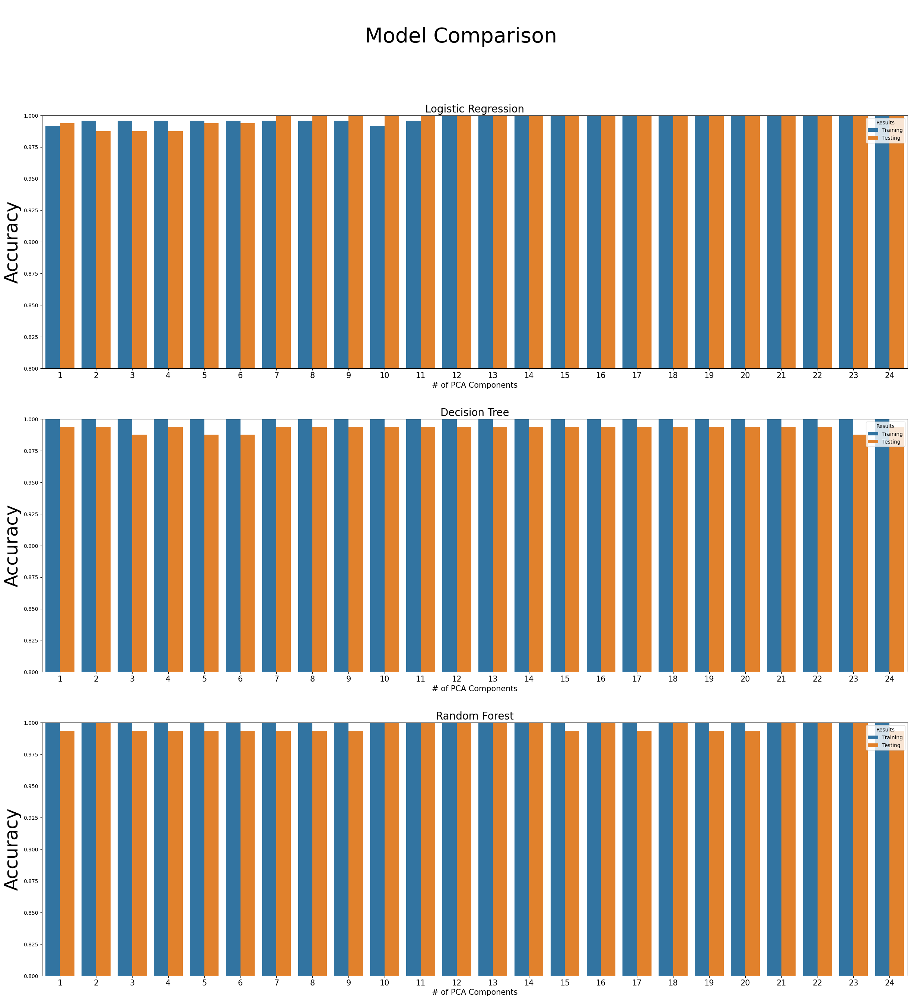

In [45]:
n_rows, n_cols= 3,1

figure, axes = plt.subplots(nrows=n_rows,ncols= n_cols, figsize=(30, 30))

figure.suptitle('\nModel Comparison', fontsize=40)
# set up empty arrays for training/testing labels to use later
tr_result = np.empty(shape=(24,1),dtype="object")
ts_result = np.empty(shape=(24,1),dtype="object")

for i in range(24):
    tr_result[i]="Training"
    ts_result[i]="Testing"

result = np.vstack((tr_result,ts_result))
result=result.reshape((48,))

# set range for number of pca components, duplicate for train/test
comps=[i for i in range(1,25)] * 2

for index in range(3):
    pca_tr_acc=[]
    pca_ts_acc=[]
    
    for n_comps in range(1,25):
        
        model=best_models[index]
        
        pca=PCA(n_components=n_comps)
        
        pca_model=make_pipeline(pca,model)
        
        pca_model.fit(X_train,Y_train)
        
        y_tr_pred= pca_model.predict(X_train)
               
        pca_tr_acc.append(accuracy_score(y_tr_pred,Y_train))
        
        y_ts_pred=pca_model.predict(X_test)
        
        pca_ts_acc.append(accuracy_score(y_ts_pred,Y_test))
    
    amodel_data = pd.DataFrame()
    
    amodel_data["PCA"] = pca_tr_acc + pca_ts_acc
        
    amodel_data["Results"] = result
    
    amodel_data["Model"] = best_names[index]
    
    
    sns.barplot(x=comps, y="PCA", hue="Results", data=amodel_data, ax=axes[index]).set(ylim=(0.8,1))
    
    axes[index].set_title(best_names[index],fontsize=20)
    
    axes[index].set_xlabel("# of PCA Components",fontsize=15)
    
    axes[index].set_ylabel("Accuracy",fontsize=35)
    
    axes[index].set_xticklabels(axes[index].get_xticklabels(),fontsize=15)
        
    
plt.show()


tSNE with CKD Scaled Data

In [46]:
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.4, random_state=12)

In [47]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, random_state=123)
tsne_data = tsne.fit_transform(scaled_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 1.253770
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.645851
[t-SNE] KL divergence after 1000 iterations: 0.835292


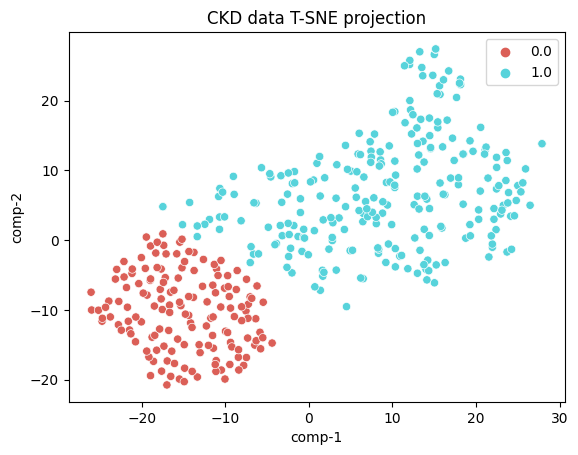

In [48]:

df = pd.DataFrame()
df["Y"] = Y
df["comp-1"] = tsne_data[:,0]
df["comp-2"] = tsne_data[:,1]

ax = sns.scatterplot(x="comp-1", y="comp-2", hue=df.Y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="CKD data T-SNE projection")


Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

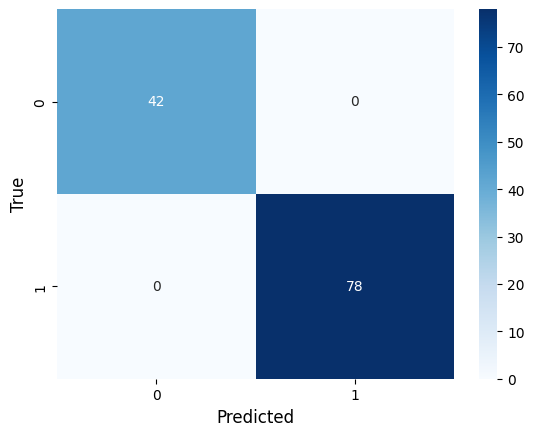

In [49]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train_tsne, y_train)

# Make predictions
y_pred = clf.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

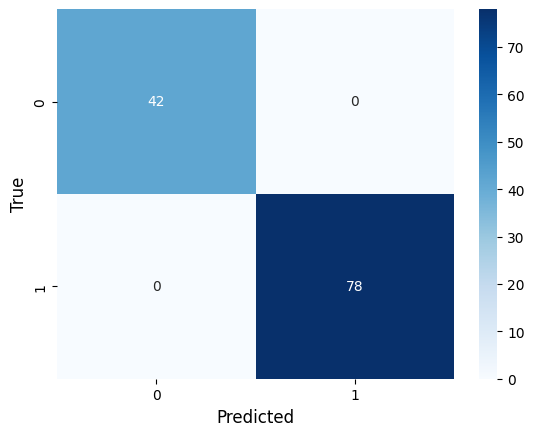

In [50]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = dtc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

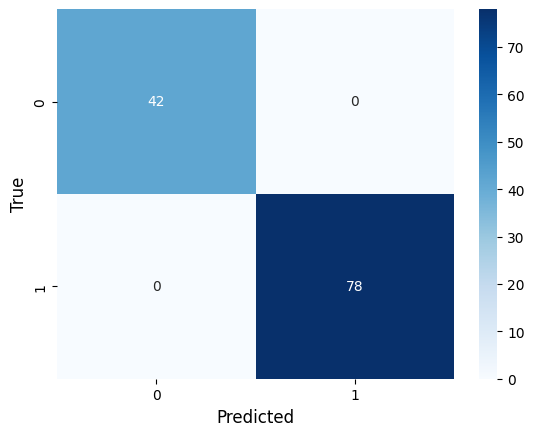

In [51]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = rfc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

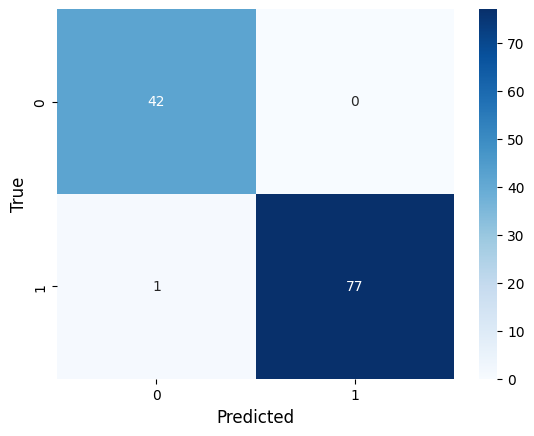

In [52]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = svc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

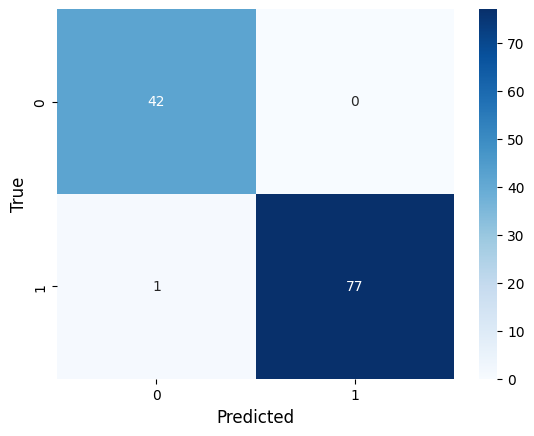

In [53]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train_tsne, y_train)

# Make predictions
y_pred = knn.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.98
Test accuracy: 0.98

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

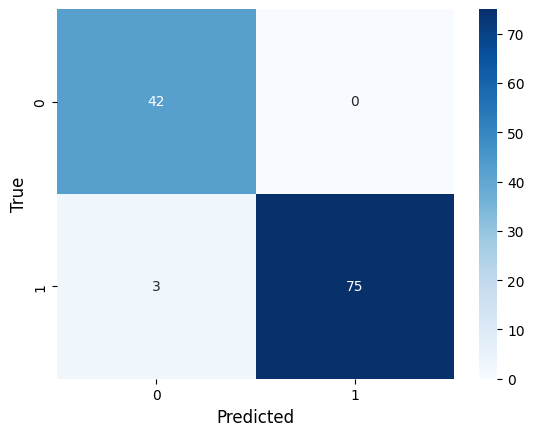

In [54]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train_tsne, y_train)

# Make predictions
y_pred = gnb.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

PCA

In [64]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 2)
df_pca = pca.fit_transform(scaled_data)

# Just turn into dataframe
df_pca = pd.DataFrame(df_pca)
df_pca.rename(columns = {0:'comp-1', 1:'comp-2'}, inplace = True)
df_pca['label'] = Y

df_pca.head()

,comp-1,comp-2,label
0,-0.981973,-0.485413,1.0
1,-1.573697,0.816205,1.0
2,3.156721,-1.775070,1.0
3,4.105989,1.258008,1.0
4,-0.653222,0.160370,1.0


[Text(0.5, 1.0, 'CKD data PCA projection')]

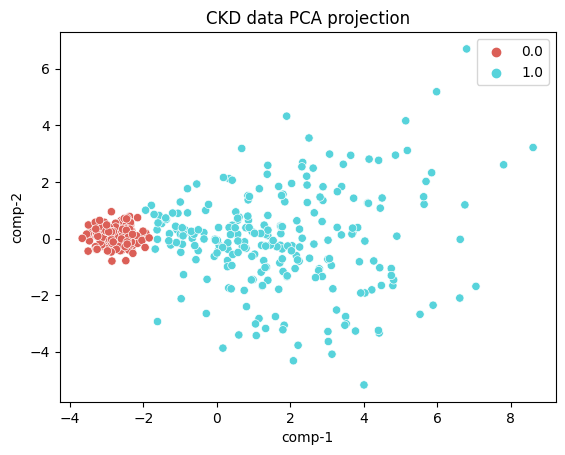

In [65]:
sns.scatterplot(
  data = df_pca,
  hue = df_pca['label'].tolist(),
  palette = sns.color_palette("hls", 2),
  x = "comp-1", y = "comp-2", 
).set(title="CKD data PCA projection") 

In [66]:
df_pca = df_pca.drop(columns = ['label'])
df_pca.head()

,comp-1,comp-2
0,-0.981973,-0.485413
1,-1.573697,0.816205
2,3.156721,-1.775070
3,4.105989,1.258008
4,-0.653222,0.160370


Train accuracy: 0.99
Test accuracy: 0.98

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

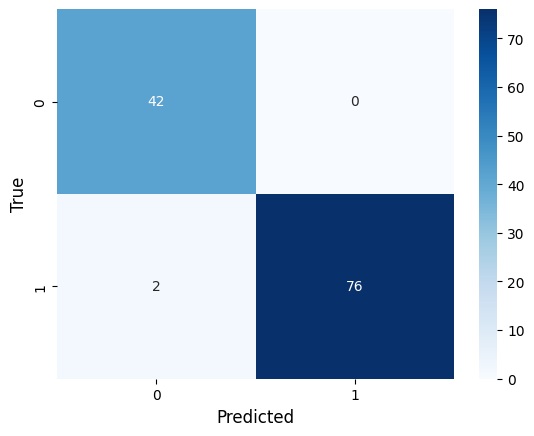

In [67]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train_pca, y_train)

# Make predictions
y_pred = clf.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

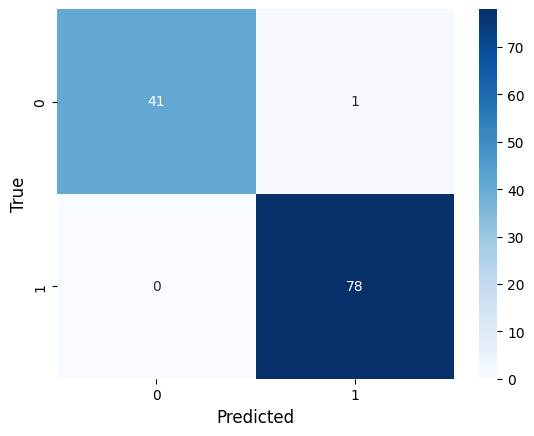

In [68]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train_pca, y_train)

# Make predictions
y_pred = dtc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

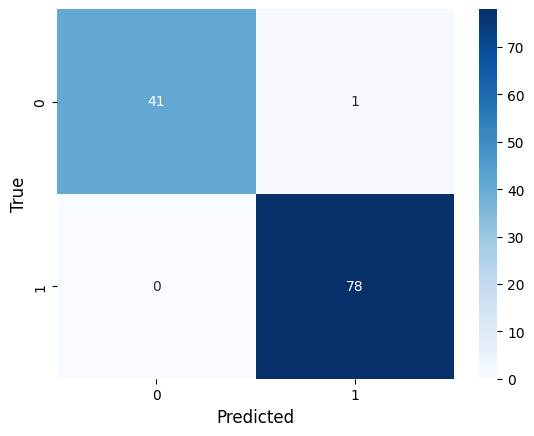

In [69]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train_pca, y_train)

# Make predictions
y_pred = rfc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

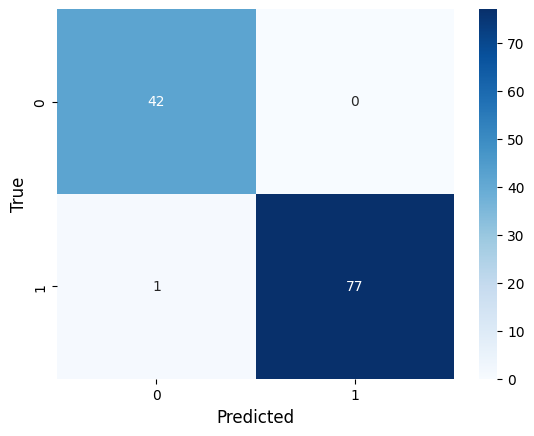

In [70]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train_pca, y_train)

# Make predictions
y_pred = svc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

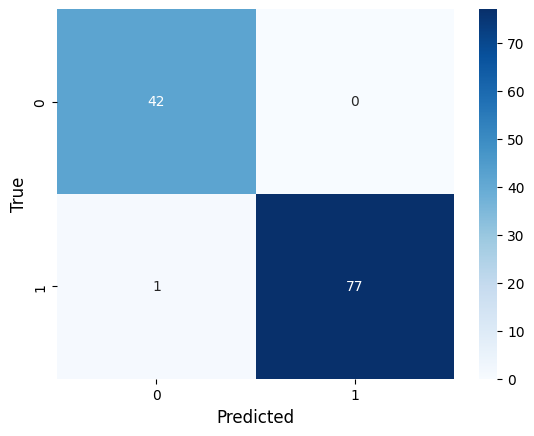

In [71]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train_pca, y_train)

# Make predictions
y_pred = knn.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

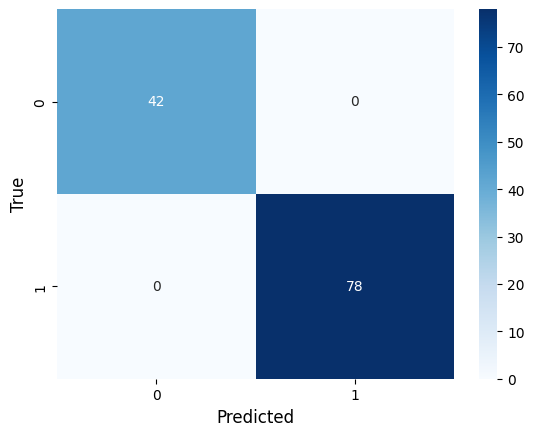

In [72]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train_pca, y_train)

# Make predictions
y_pred = gnb.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Scaled Data Models

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

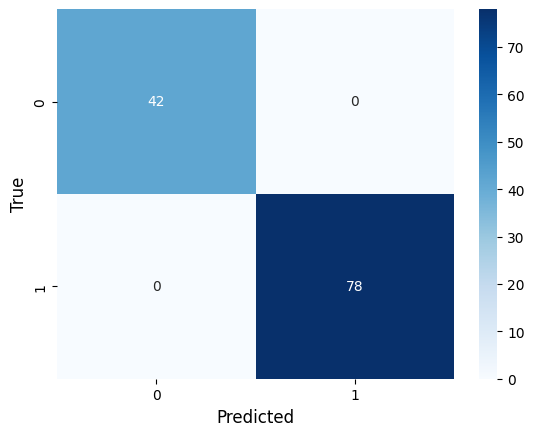

In [73]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

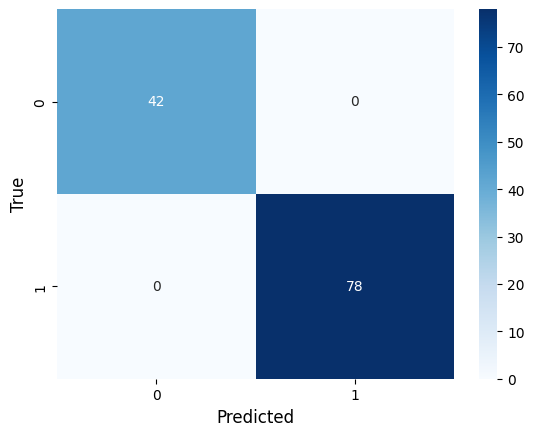

In [74]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train, y_train)

# Make predictions
y_pred = dtc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

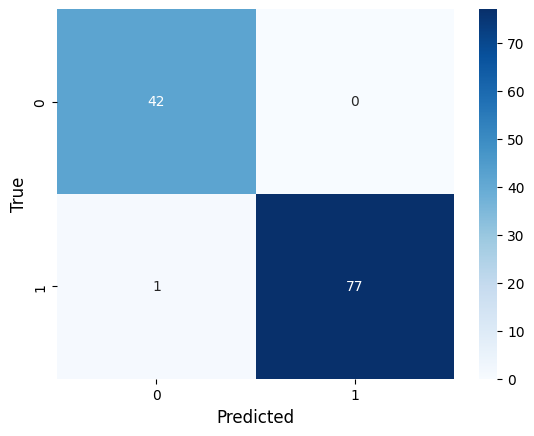

In [76]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train, y_train)

# Make predictions
y_pred = rfc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

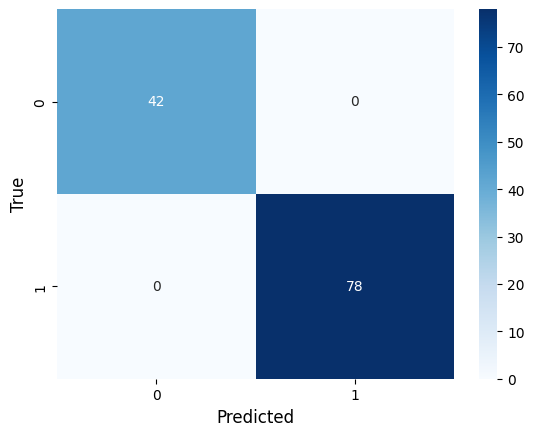

In [77]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train, y_train)

# Make predictions
y_pred = svc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.97
Test accuracy: 0.97

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

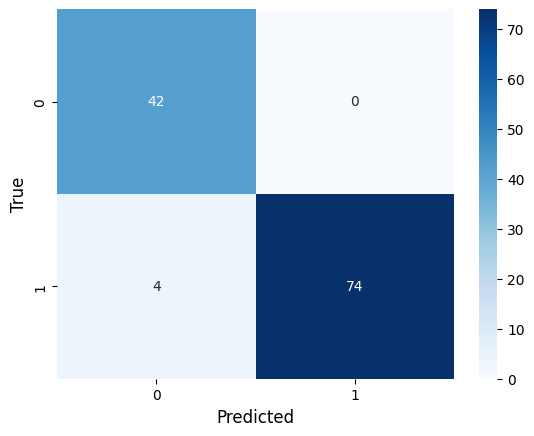

In [78]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train, y_train)

# Make predictions
y_pred = knn.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.97
Test accuracy: 0.96

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

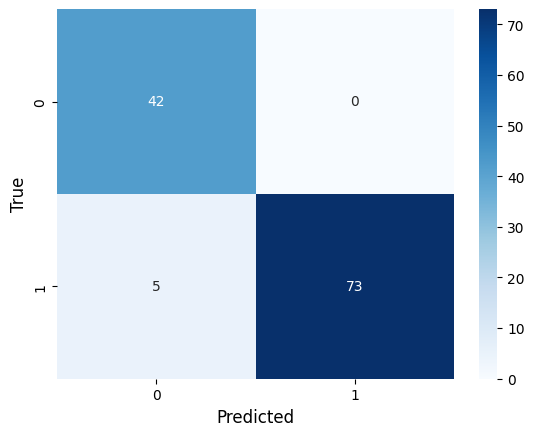

In [79]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train, y_train)

# Make predictions
y_pred = gnb.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Feature Selection

In [80]:
scaled3=standard.fit_transform(encoded)
scaled3.shape

(400, 25)

<Axes: >

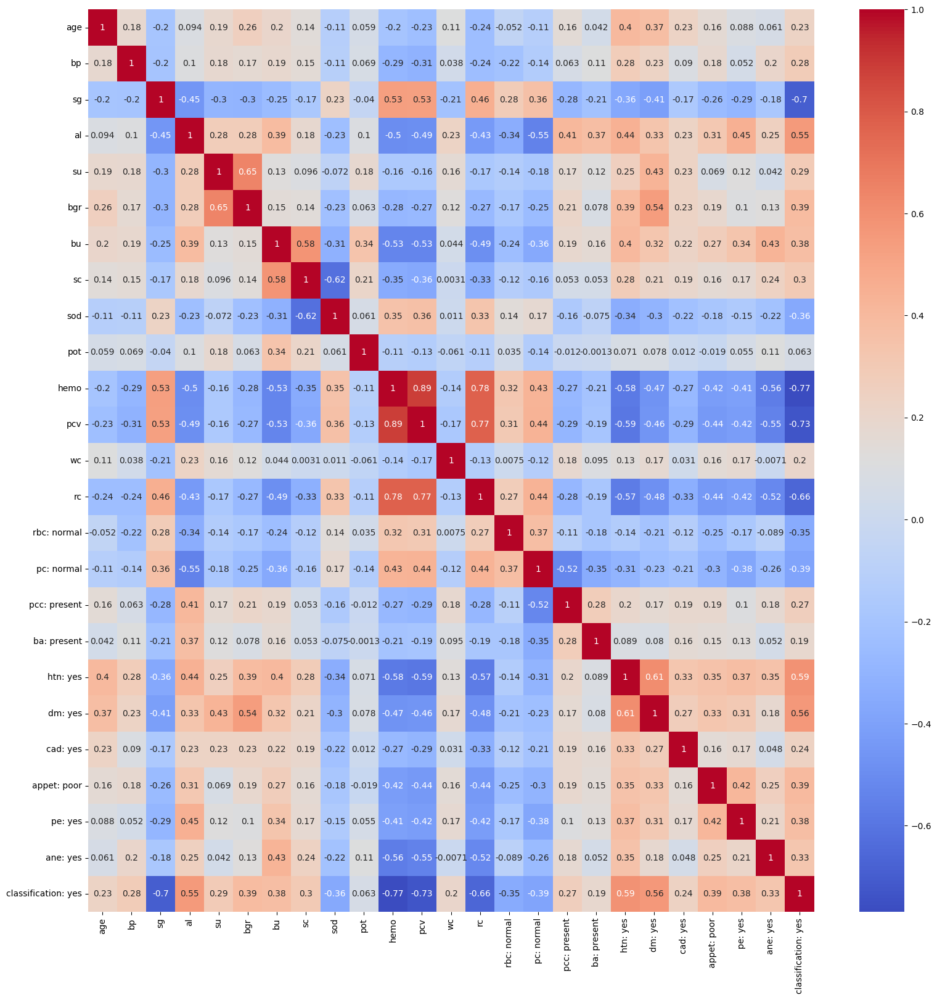

In [81]:
#correlation
plt.figure(figsize = (19,19))
sns.heatmap(encoded.corr(), annot = True, cmap = 'coolwarm') # looking for strong correlations with "class" row

[0.00546721 0.01102728 0.12689633 0.09085844 0.01003    0.01611194
 0.0126504  0.01859648 0.00810372 0.00560702 0.10033923 0.12849655
 0.00405167 0.06808504 0.03005616 0.03258088 0.00754938 0.00156658
 0.12462247 0.10995368 0.00055435 0.04127992 0.02746505 0.01805023]


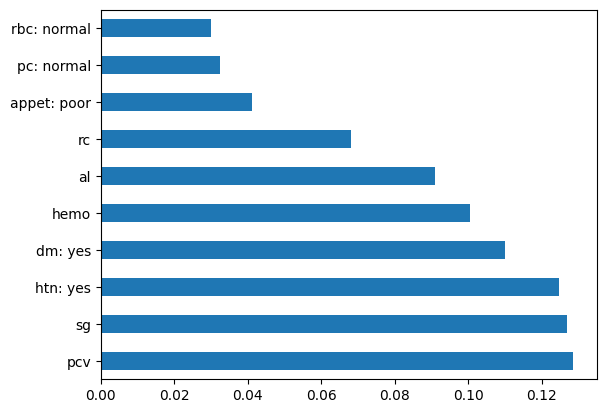

In [82]:
import pandas as pd
import numpy as np
'''
data = pd.read_csv("D://Blogs//train.csv")
X = data.iloc[:,0:20]  #independent columns
y = data.iloc[:,-1]    #target column i.e price range
'''
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,Y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [83]:
#Create an abridged dataframe with the most important features: sg, pcv, htn, hemo, dm
encoded2 = encoded[['sg', 'pcv', 'htn: yes', 'hemo', 'dm: yes', 'classification: yes']].copy()
encoded2.head()

,sg,pcv,htn: yes,hemo,dm: yes,classification: yes
0,1.020,44.0,1.0,15.4,1.0,1.0
1,1.020,38.0,0.0,11.3,0.0,1.0
2,1.010,31.0,0.0,9.6,1.0,1.0
3,1.005,32.0,1.0,11.2,0.0,1.0
4,1.010,35.0,0.0,11.6,0.0,1.0


In [84]:
#create new X and Y
X=encoded2.drop("classification: yes",axis=1,inplace=False)
Y=encoded2["classification: yes"]

scaled=standard.fit_transform(encoded2)
scaled_data=standard.fit_transform(X)

Scaled Data Models w/ Feature Selection

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

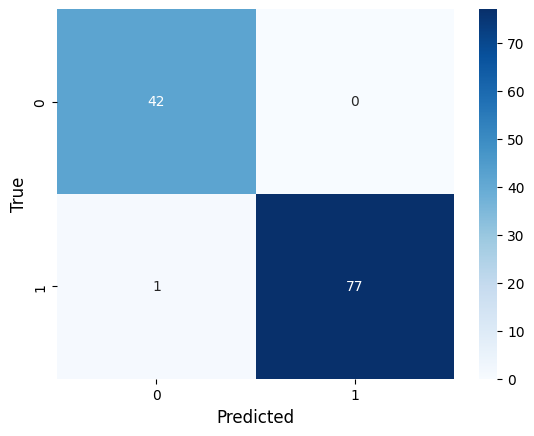

In [85]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

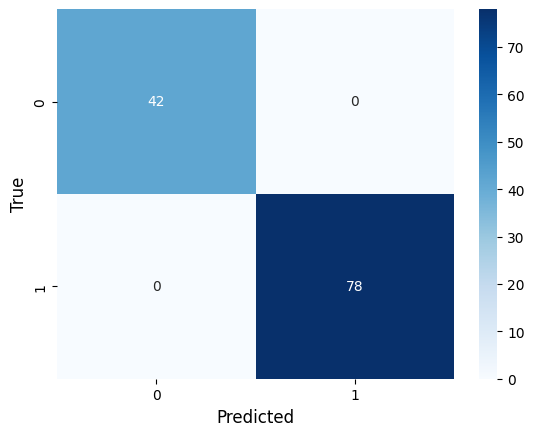

In [86]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train, y_train)

# Make predictions
y_pred = dtc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

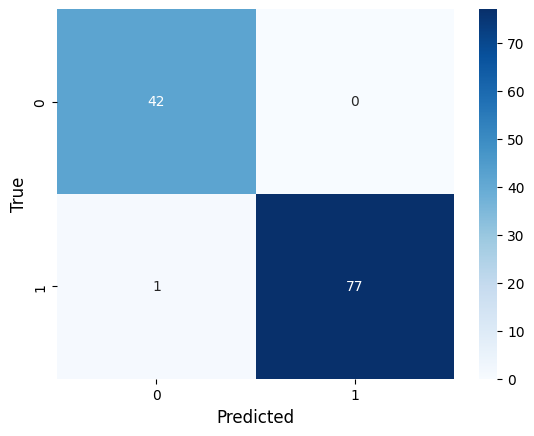

In [87]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train, y_train)

# Make predictions
y_pred = rfc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

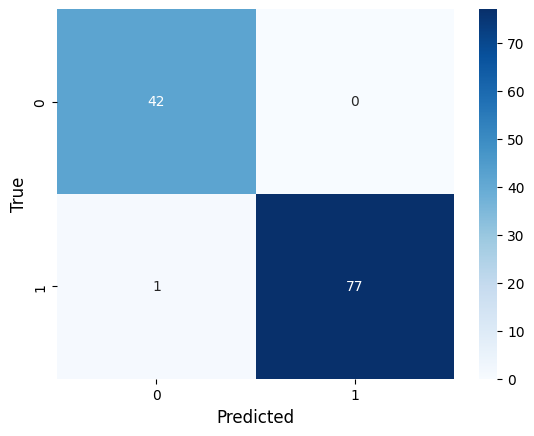

In [88]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train, y_train)

# Make predictions
y_pred = svc.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

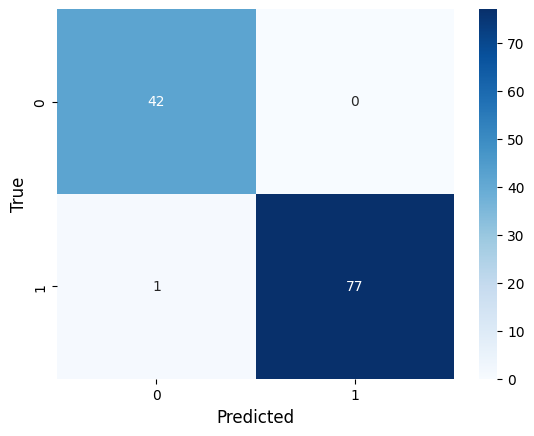

In [89]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train, y_train)

# Make predictions
y_pred = knn.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.85
Test accuracy: 0.83

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

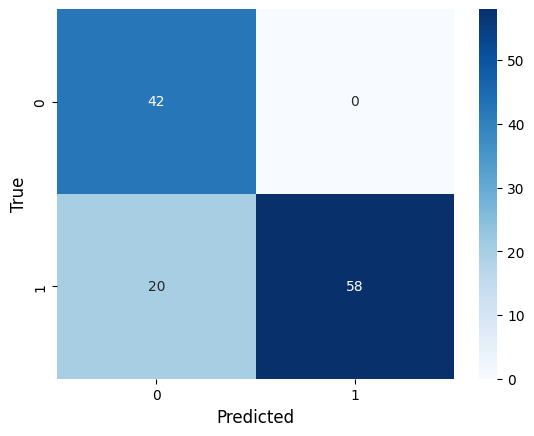

In [90]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train, y_train)

# Make predictions
y_pred = gnb.predict(X_test) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

PCA with Feature Selection

In [91]:
from sklearn import decomposition
pca = decomposition.PCA(n_components = 2)
df_pca = pca.fit_transform(scaled_data)

# Just turn into dataframe
df_pca = pd.DataFrame(df_pca)
df_pca.rename(columns = {0:'comp-1', 1:'comp-2'}, inplace = True)
df_pca['label'] = Y

df_pca.head()

,comp-1,comp-2,label
0,0.101627,-2.230893,1.0
1,-0.579804,0.767171,1.0
2,1.679304,0.636175,1.0
3,1.743695,1.140814,1.0
4,0.236659,1.606269,1.0


[Text(0.5, 1.0, 'CKD data PCA projection')]

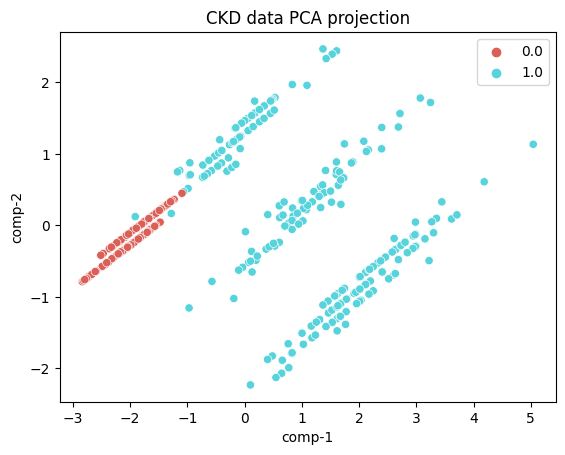

In [92]:
sns.scatterplot(
  data = df_pca,
  hue = df_pca['label'].tolist(),
  palette = sns.color_palette("hls", 2),
  x = "comp-1", y = "comp-2", 
).set(title="CKD data PCA projection") 

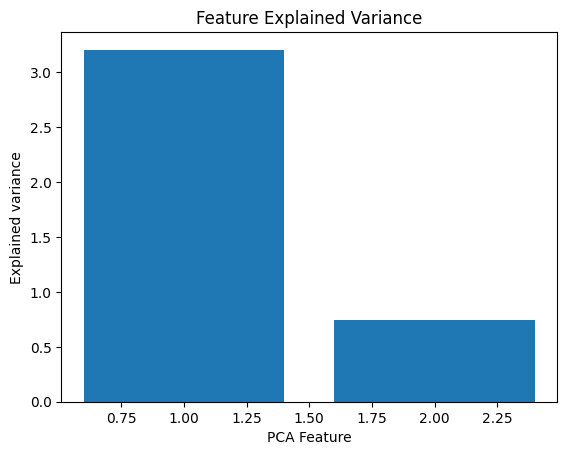

In [93]:
# Bar plot of explained_variance
plt.bar(
    range(1,len(pca.explained_variance_)+1),
    pca.explained_variance_
    )


plt.xlabel('PCA Feature')
plt.ylabel('Explained variance')
plt.title('Feature Explained Variance')
plt.show()

In [94]:
df_pca = df_pca.drop(columns = ['label'])
df_pca.head()

,comp-1,comp-2
0,0.101627,-2.230893
1,-0.579804,0.767171
2,1.679304,0.636175
3,1.743695,1.140814
4,0.236659,1.606269


Train accuracy: 0.99
Test accuracy: 0.98

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

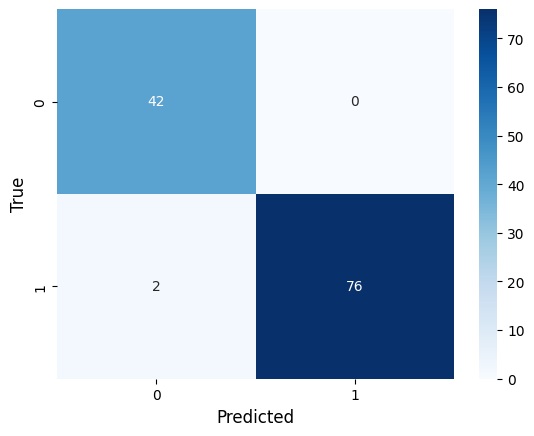

In [95]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train_pca, y_train)

# Make predictions
y_pred = clf.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

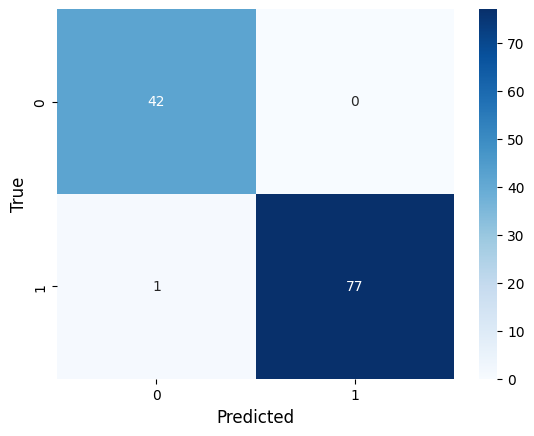

In [96]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train_pca, y_train)

# Make predictions
y_pred = dtc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

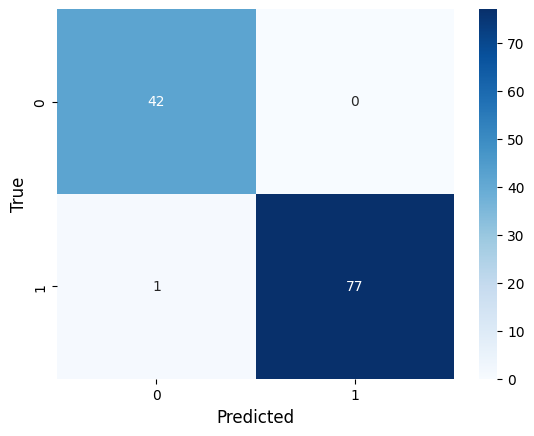

In [97]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train_pca, y_train)

# Make predictions
y_pred = rfc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.98

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

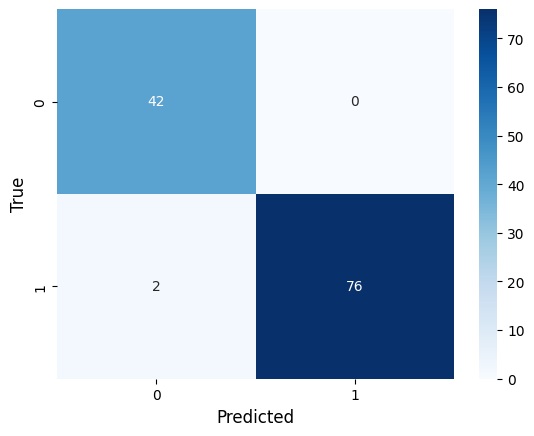

In [98]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train_pca, y_train)

# Make predictions
y_pred = svc.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

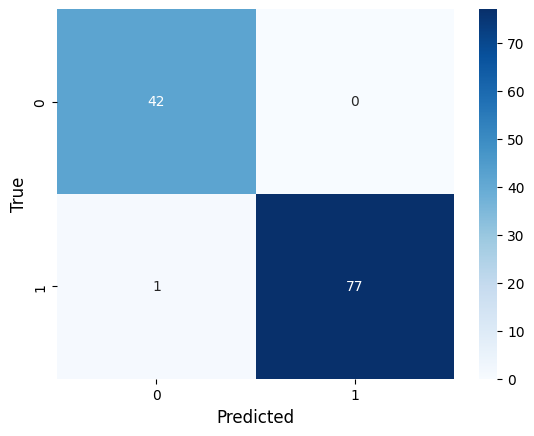

In [99]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train_pca, y_train)

# Make predictions
y_pred = knn.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

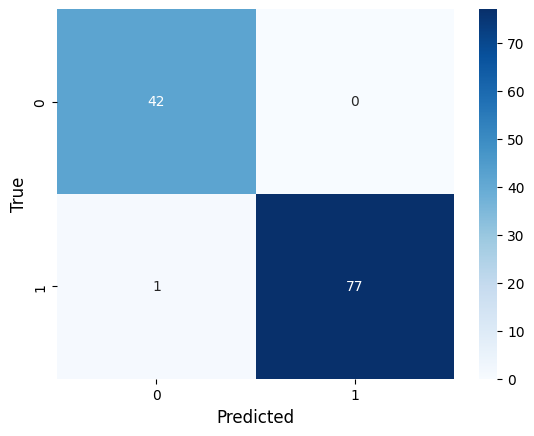

In [100]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_pca, X_test_pca, y_train, y_test = train_test_split(df_pca, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train_pca, y_train)

# Make predictions
y_pred = gnb.predict(X_test_pca) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train_pca)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

t-SNE w/ Feature Selection

In [101]:
X_train, X_test, Y_train, Y_test = train_test_split(scaled_data, Y, test_size=0.4, random_state=12)

In [102]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, perplexity = 30, verbose=1, random_state=123)
tsne_data = tsne.fit_transform(scaled_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.555799
[t-SNE] KL divergence after 250 iterations with early exaggeration: 47.934311
[t-SNE] KL divergence after 1000 iterations: 0.186008


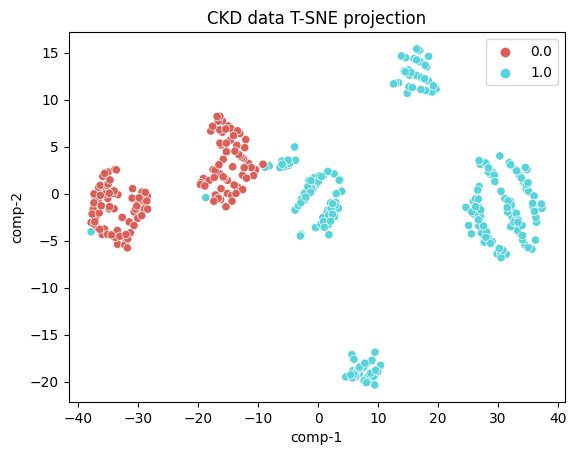

In [103]:

df = pd.DataFrame()
df["Y"] = Y
df["comp-1"] = tsne_data[:,0]
df["comp-2"] = tsne_data[:,1]

ax = sns.scatterplot(x="comp-1", y="comp-2", hue=df.Y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="CKD data T-SNE projection")


Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

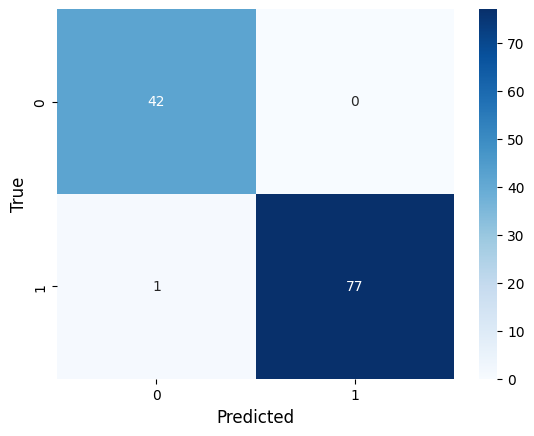

In [104]:
#LOGISTIC REGRESSION
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

# Train the model
clf.fit(X_train_tsne, y_train)

# Make predictions
y_pred = clf.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

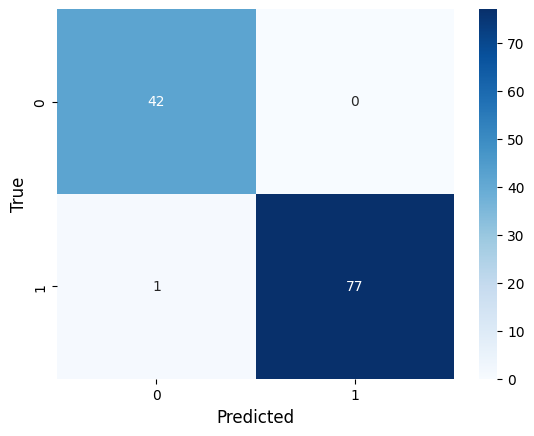

In [105]:
#DECISION TREE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()

# Train the model
dtc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = dtc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 dtc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 1.0
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

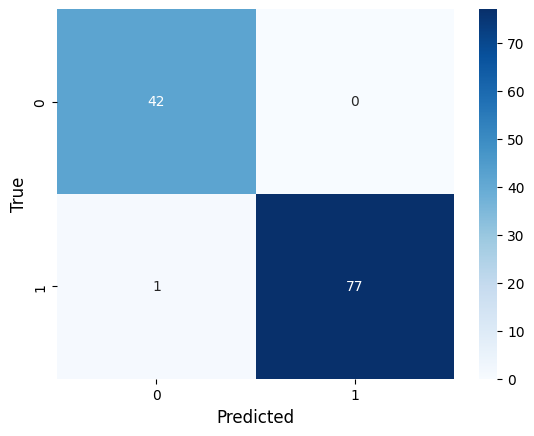

In [106]:
#RANDOM FOREST
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.ensemble import RandomForestClassifier
rfc = DecisionTreeClassifier()

# Train the model
rfc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = rfc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 rfc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

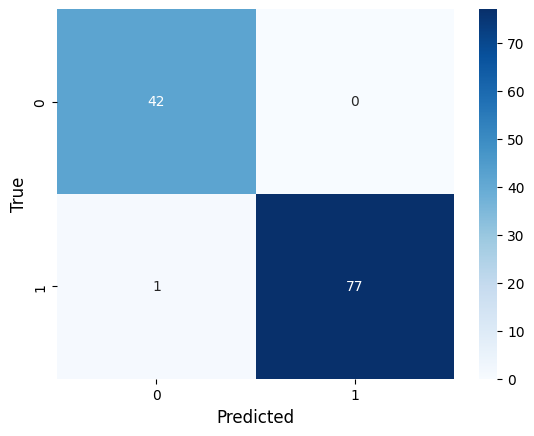

In [107]:
#SUPPORT VECTOR MACHINE
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.svm import SVC
svc = SVC()

# Train the model
svc.fit(X_train_tsne, y_train)

# Make predictions
y_pred = svc.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 svc.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.99
Test accuracy: 0.99

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

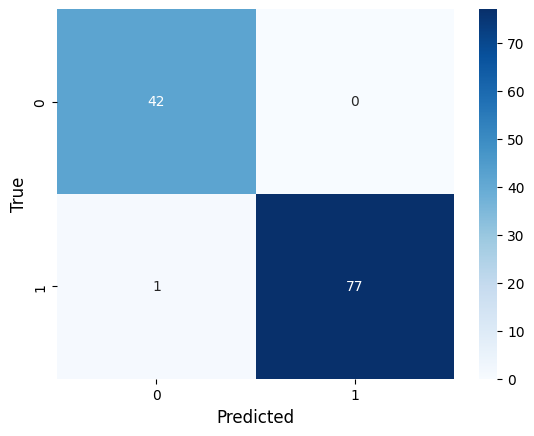

In [108]:
#K-NEAREST NEIGHBOR
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train_tsne, y_train)

# Make predictions
y_pred = knn.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 knn.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Train accuracy: 0.98
Test accuracy: 0.98

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

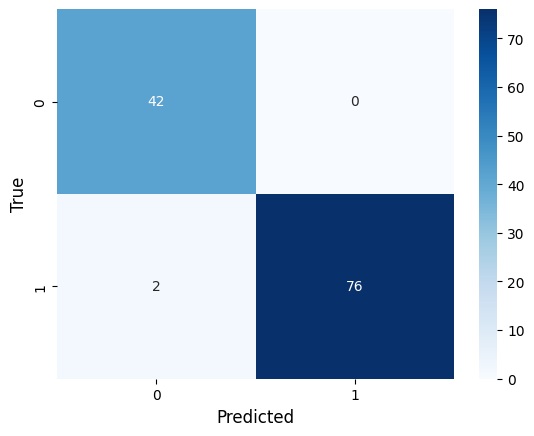

In [109]:
#NAIVE BAYES
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.3, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()

# Train the model
gnb.fit(X_train_tsne, y_train)

# Make predictions
y_pred = gnb.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 gnb.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

Some additional experiments below

In [ ]:
#LogisticRegression
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.2, 
                                                            shuffle=True, random_state=2)
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression(solver = 'lbfgs')
logisticRegr.fit(X_train_tsne, y_train)
logisticRegr.predict(X_test_tsne[0:2])
predictions = logisticRegr.predict(X_test_tsne)
score = logisticRegr.score(X_test_tsne, y_test)
print(score)

1.0


In [ ]:
cm = metrics.confusion_matrix(y_test, predictions)
print(cm)

[[26  0]
 [ 0 54]]


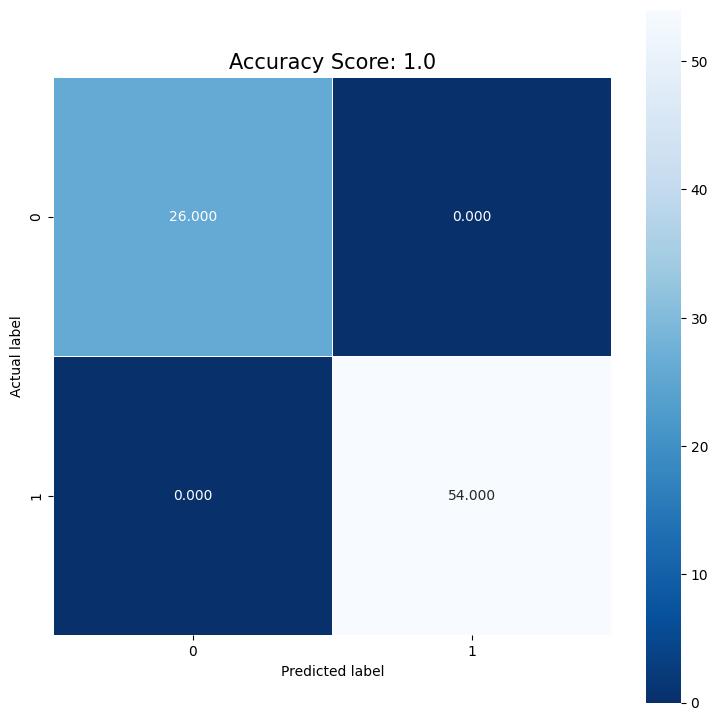

In [ ]:
plt.figure(figsize=(9,9))
sns.heatmap(cm, annot=True, fmt=".3f", linewidths=.5, square = True, cmap = 'Blues_r');
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
all_sample_title = 'Accuracy Score: {0}'.format(score)
plt.title(all_sample_title, size = 15);

In [ ]:
import numpy as np
from sklearn.metrics import roc_auc_score 
y_true = np.array([0, 0, 1, 1])
y_scores = np.array([0.1, 0.4, 0.35, 0.8])
roc_auc_score(y_true, y_scores)

0.75

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components = 2, verbose = 1, init = 'random', learning_rate = 'auto', random_state = 123)
tsne_data = tsne.fit_transform(scaled_data)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.187s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 1.253770
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.634109
[t-SNE] KL divergence after 1000 iterations: 0.813230


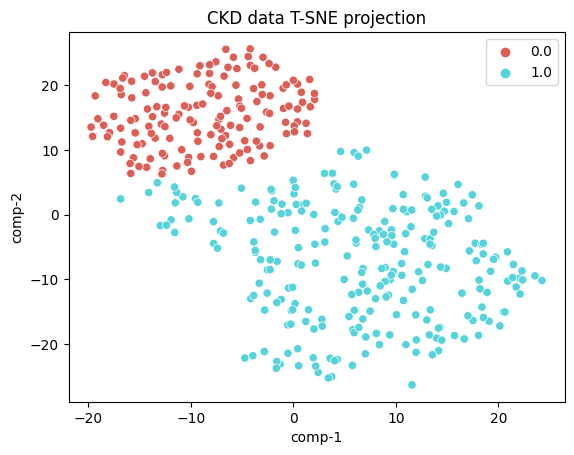

In [ ]:
df = pd.DataFrame()
df["Y"] = Y
df["comp-1"] = tsne_data[:,0]
df["comp-2"] = tsne_data[:,1]

ax = sns.scatterplot(x="comp-1", y="comp-2", hue=df.Y.tolist(),
                palette=sns.color_palette("hls", 2),
                data=df).set(title="CKD data T-SNE projection")

Train accuracy: 1.0
Test accuracy: 1.0

Test confusion_matrix


Text(50.722222222222214, 0.5, 'True')

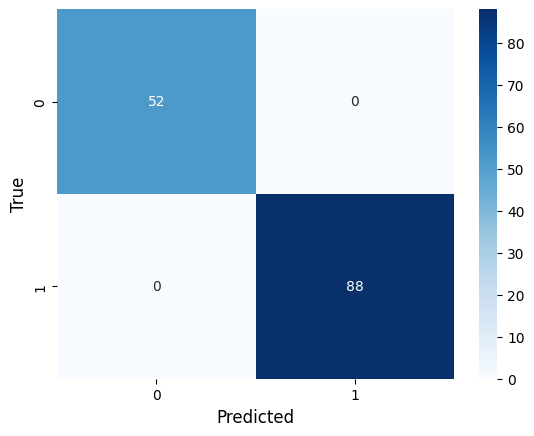

In [ ]:
# Make train and test sets
from sklearn.model_selection import train_test_split
X_train_tsne, X_test_tsne, y_train, y_test = train_test_split(tsne_data, Y, test_size=0.35, 
                                                            shuffle=True, random_state=2)

# Initialize the logistic regression model
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(max_iter=2500)

# Train the model
clf.fit(X_train_tsne, y_train)

# Make predictions
y_pred = clf.predict(X_test_tsne) # Predictions
y_true = y_test # True values

# Measure accuracy
from sklearn.metrics import accuracy_score
import numpy as np
print("Train accuracy:", np.round(accuracy_score(y_train, 
                                                 clf.predict(X_train_tsne)), 2))
print("Test accuracy:", np.round(accuracy_score(y_true, y_pred), 2))

# Make the confusion matrix
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_true, y_pred)
print("\nTest confusion_matrix")
sns.heatmap(cf_matrix, annot=True, cmap='Blues')
plt.xlabel('Predicted', fontsize=12)
plt.ylabel('True', fontsize=12)

In [ ]:
tsne_data.shape


(400, 2)

In [ ]:
scaled_data.shape

(400, 24)